# Proba 2 - Computer Vision (CV): ROAI TransportationCo - Intro notebook

<img src="https://drive.google.com/uc?export=view&id=1e9mg75HvTjHUbZk06LJO7Zqy7PDi5RfQ">


## Statement
You are hired on a position of a Data Scientist in a company called ROAI TransportationCo. The company is specialized in transportation and logistics. 
The company has a set of transportation units labeled as follows:  'boat', 'airplane', 'train', 'bus', 'truck'.
They have a dataset of images of these transportation units. The dataset is stored in  https://huggingface.co/datasets/unibuc-cs/ROAItransportationCo . Do not worry, we provide you with the code to download the dataset below!


The previous person in your position did a great job in helping the marketing team by creating a generative AI model that is able to generate images of transportation units within different environments starting from a text prompt. Not important for you, but the marketing team studies very well the client and creates the text prompts accordingly to users' preferences to make them pay as much as possible. The current model is available at https://huggingface.co/unibuc-cs/ROAItransportationCo-miniSD. Again, do not worry, we provide you with the code to download the model below!.

The problem is that the model has seen only the following transportation labels: 'bus', 'truck', 'train'. Because the financial crisis is finally over and the company is expanding, they just acquired a new fleet of boats and aircraft. 
Thus, the marketing team wants to expand the model to generate images starting from textual prompts (English) for the other two labels: 'boat', 'aircraft'. 





 



## Just Knowledge transfer - Don't spent effort on running the cells, just read them! 
Apart from your courses preparation, the AI engineer left an introductory notebook to ``diffusers``. If you are familiar with the concept, you can skip everything here and jump to IOAI_CV_Problem_task!
Aditional material can be found here: https://huggingface.co/learn/diffusion-course/unit1/1 . 

Don't forget to turn on GPU in notebook (edit -> notebook settings -> T4 possible, but L4 GPU recommended for good training sessions)






## Dependencies

In [3]:
import importlib

if importlib.util.find_spec('diffusers') is None:
    !pip install diffusers transformers accelerate datasets

if importlib.util.find_spec('huggingface_hub') is None:
    !pip install huggingface_hub

!pip install datasets

# Let's play with diffusion 

### Download the model and use diffusers library to make some examples

In [6]:
from diffusers import DiffusionPipeline
import torch
base_model_name = "OFA-Sys/small-stable-diffusion-v0" # "lambdalabs/miniSD-diffusers"
pipe = DiffusionPipeline.from_pretrained(base_model_name)
device = 'cuda'
pipe.to(device)

safety_checker/model.safetensors not found


Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

The config attributes {'predict_epsilon': True} were passed to DPMSolverMultistepScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.
An error occurred while trying to fetch /home/ciprian/.cache/huggingface/hub/models--OFA-Sys--small-stable-diffusion-v0/snapshots/38e10e5e71e8fbf717a47a81e7543cd01c1a8140/vae: Error no file named diffusion_pytorch_model.safetensors found in directory /home/ciprian/.cache/huggingface/hub/models--OFA-Sys--small-stable-diffusion-v0/snapshots/38e10e5e71e8fbf717a47a81e7543cd01c1a8140/vae.
Defaulting to unsafe serialization. Pass `allow_pickle=False` to raise an error instead.
An error occurred while trying to fetch /home/ciprian/.cache/huggingface/hub/models--OFA-Sys--small-stable-diffusion-v0/snapshots/38e10e5e71e8fbf717a47a81e7543cd01c1a8140/unet: Error no file named diffusion_pytorch_model.safetensors found in directory /home/ciprian/.cache/huggingface/hub/models--OFA-Sys--small-stable-diffusion-

StableDiffusionPipeline {
  "_class_name": "StableDiffusionPipeline",
  "_diffusers_version": "0.30.0.dev0",
  "_name_or_path": "OFA-Sys/small-stable-diffusion-v0",
  "feature_extractor": [
    "transformers",
    "CLIPImageProcessor"
  ],
  "image_encoder": [
    null,
    null
  ],
  "requires_safety_checker": true,
  "safety_checker": [
    "stable_diffusion",
    "StableDiffusionSafetyChecker"
  ],
  "scheduler": [
    "diffusers",
    "DPMSolverMultistepScheduler"
  ],
  "text_encoder": [
    "transformers",
    "CLIPTextModel"
  ],
  "tokenizer": [
    "transformers",
    "CLIPTokenizer"
  ],
  "unet": [
    "diffusers",
    "UNet2DConditionModel"
  ],
  "vae": [
    "diffusers",
    "AutoencoderKL"
  ]
}

### Now let's try some prompt and see the generated image

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

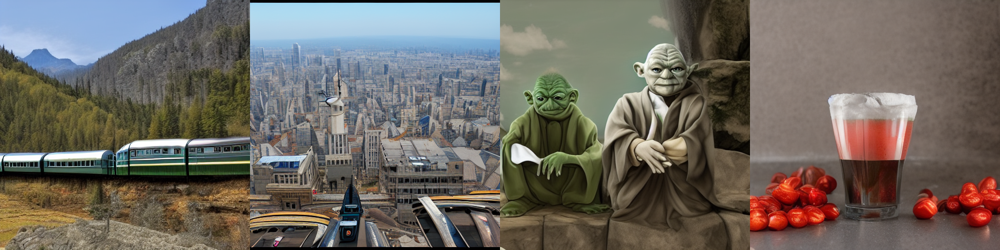

In [12]:
from PIL import Image

# Create a generator and set a seed to id for reproducibily
generator = torch.Generator("cuda").manual_seed(0)

def image_grid(imgs, rows=2, cols=2):
    w, h = imgs[0].size
    grid = Image.new("RGB", size=(cols * w, rows * h))

    for i, img in enumerate(imgs):
        grid.paste(img, box=(i % cols * w, i // cols * h))
    return grid

def generate_img(prompt):
    image = pipe(prompt=prompt, generator=torch.Generator(device=device).manual_seed(42), num_inference_steps=20).images[0]
    image.resize((384, 384))
    return image
    

def demo_eval():
    # Put some prompts here and return the generated images
    generated_imgs = []
    for prompt in ['A train in mountains', 
                   'An airplane over a city', 
                   'Yoda and Skywalker are brothers',
                   "Cola zero or Cola one"]:
        generated_imgs.append(generate_img(prompt))

    return generated_imgs

image_grid(demo_eval(), 1,4)



# Analyze the components
Images do not look very good, but we do not want to invest too much in AI resources for now. Let's prototype to see how it works.
Let's see what the model consists of:

In [7]:
pipe.to("cpu")
print(pipe.components.keys())

dict_keys(['vae', 'text_encoder', 'tokenizer', 'unet', 'scheduler', 'safety_checker', 'feature_extractor', 'image_encoder'])


### Tokenizer and text_encoder
As you studied in the training program, the components `tokenizer` and `text_encoder` works with text.
More specifically, model operates with numbers, and they do this conversion and preparation to send it to the model!

First, let's see how a textual prompt is converted to numbers, and how we can decode it back

In [8]:
tokenizer = pipe.tokenizer
prompt = 'A train is very cool'
encoded_text = tokenizer(prompt)
print(f"Tokenizer results: {encoded_text}")

decoded_back = " ".join(tokenizer.decode(x) for x in encoded_text['input_ids'])
print(f"From tokenizer to text decoding: {decoded_back}")


Tokenizer results: {'input_ids': [49406, 320, 3231, 533, 1070, 2077, 49407], 'attention_mask': [1, 1, 1, 1, 1, 1, 1]}
From tokenizer to text decoding: <|startoftext|> a train is very cool <|endoftext|>


Now, let's see how the text is encoded in the model and compute a similarity measure between some examples using a vector dot product, as in geometry.
As you note, similar words, depending on their semantics, get better cosine similarity score than those that are 'far away' from each other.

In [9]:
from torch.nn.functional import cosine_similarity as similarity
text_encoder = pipe.text_encoder

def get_vector(name):
    tokens = tokenizer(name, return_tensors='pt')['input_ids']
    sequence = text_encoder(tokens).last_hidden_state
    vector = sequence[:, 1]  # we took 1, because on position 0 is <|startoftext|> token
    return vector

train_vector = get_vector('train')
spaceship_vector = get_vector('spaceship')
bus_vector = get_vector('bus')

print('Similarity between train and bus is', similarity(train_vector, bus_vector).item())
print('Similarity between train and spaceship is', similarity(train_vector, spaceship_vector).item())


Similarity between train and bus is 0.3581472635269165
Similarity between train and spaceship is 0.18344730138778687


### VAE (variational autoencoder)
VAE works with images. It's a neural network that can encode an image into a compact representation (latent space) and then decode it back. It is more compact and robust than pixel values. Imagine, for example, that you wanted to have a picture of an aircraft with you, but you are limited on space.

Below we load an image, compress, then decompress it back. Not precise, but good enough.


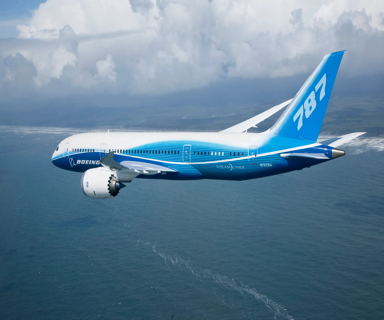

Original size: torch.Size([1, 3, 2200, 3300])
Encoded shape torch.Size([1, 4, 275, 412])


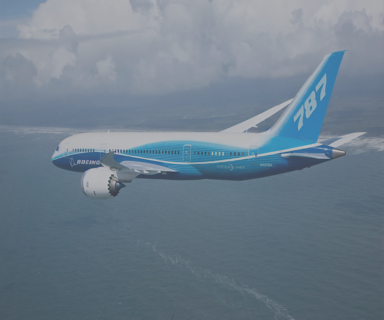

In [10]:
from PIL import Image
from torchvision.transforms.functional import pil_to_tensor, to_pil_image
import requests

# Load the picture and show it
plane_pic = Image.open("boeing.png").convert("RGB")
display(plane_pic.resize((384,320)))

# Let's get the it through VAE to compress it
vae = pipe.vae
plane_tensor = pil_to_tensor(plane_pic).float().unsqueeze(0) / 255 - 0.5   # Convert to format pytorch understands
print(f"Original size: {plane_tensor.shape}")


encoded_plane = vae.encode(plane_tensor).latent_dist.sample() # This is the latent representation
print(f"Encoded shape {encoded_plane.shape}")


# Now let's recover back and display
recovered_tensor = vae.decode(encoded_plane).sample
recovered_image = to_pil_image((recovered_tensor[0] + 1 ) / 2)
display(recovered_image.resize((384,320)))



Well, a bit blurry but compare `3*2200*3300` to `3*275*412` floats !!!


## Noise diffusion
The `unet` and `noise_scheduler` are key components here.

The model is trying to remove the noise from a given picture considering (conditioned by) the text description.

A diffusion process is like a travel in time, starting from a complete random noise and progressing over time to a meaningful image.

Check how the example below starts from a totally random noise and based on your prompt it outputs a nice picture with our company's train!

  0%|          | 0/50 [00:00<?, ?it/s]

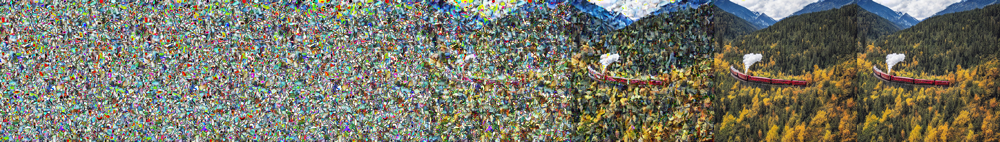

In [11]:
from diffusers.utils import make_image_grid

prompt = 'A train in mountains'
pipe.to(device)

images = []

def save_images(pipe, step, timestep, callback_kwargs):
    if step % 10 == 0:
        latents = 1 / vae.config.scaling_factor * callback_kwargs['latents']
        image = vae.decode(latents).sample[0]
        images.append(to_pil_image((image + 1 ) / 2))
    return callback_kwargs

final_image = pipe(
    prompt,
    num_inference_steps = 50, # This is how many intermediate steps are used to generate an image
    callback_on_step_end=save_images,
    callback_on_step_end_tensor_inputs=["latents"],
    generator=torch.Generator(device=device).manual_seed(46)
).images[0]

images.append(final_image)
make_image_grid(images, rows=1, cols=len(images))


The noise_scheduler component is responsible for defining the number of steps and the noise level at each step. 
Check the plot below the expected level of original image and noise we simulated during traing.

This is theory, do not worry if you don't understand this! Just SKIP and go next

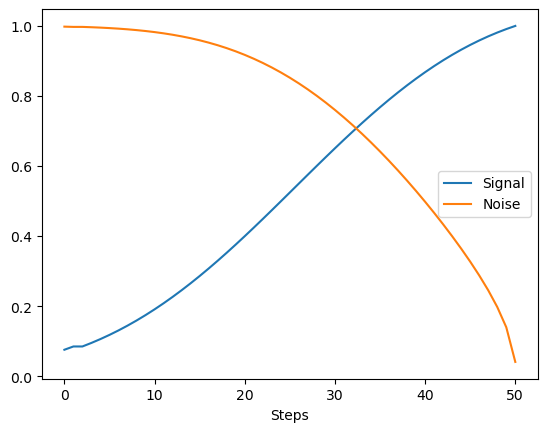

In [12]:
import matplotlib.pyplot as plt
scheduler = pipe.scheduler
alphas = scheduler.alphas_cumprod[scheduler.timesteps.cpu()]
signal = alphas ** 0.5
noise = (1-alphas)**0.5
plt.plot(signal, label='Signal')
plt.plot(noise, label='Noise')
plt.xlabel("Steps")
plt.legend()
plt.show()




Finally, the `unet` is the neural network that predicts the noise we have on encoded image. 

To see it in action, let's generate image using pipe components directly


  0%|          | 0/41 [00:00<?, ?it/s]

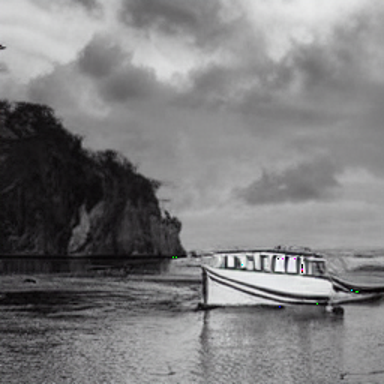

In [13]:
from tqdm.auto import tqdm

pipe.to('cuda')
scheduler = pipe.scheduler
unet = pipe.unet
vae = pipe.vae
tokenizer = pipe.tokenizer
text_encoder = pipe.text_encoder

# first we got text embeddings
prompt = ["A boat in the ocean"]
text_input = tokenizer(prompt, padding="max_length", max_length=tokenizer.model_max_length, truncation=True, return_tensors="pt")
with torch.no_grad():
    text_embeddings = text_encoder(text_input.input_ids.to(device))[0]


# We start from completely random noise
latents = torch.randn((1, 4, 32, 32), generator=torch.Generator().manual_seed(42))
latents = latents.to(device)

# Finally we move from random noise to some meaningful image step by step
scheduler.set_timesteps(40)
for i, t in tqdm(enumerate(scheduler.timesteps.long()), total=len(scheduler.timesteps)):
    latent_model_input = scheduler.scale_model_input(latents, t)

    # This is the most important part; we use unet to predict the noise and scheduler to remove it
    with torch.no_grad():
        predicted_noise = unet(latent_model_input, t, encoder_hidden_states=text_embeddings).sample
    latents = scheduler.step(predicted_noise, t, latents).prev_sample

# This will show the image from latents
latents = 1 / vae.config.scaling_factor * latents
recovered_tensor = vae.decode(latents).sample
recovered_image = to_pil_image((recovered_tensor[0] + 1 ) / 2)
display(recovered_image.resize((384,384)))
